# Imports + Helper Functions

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
sns.set_style('white', {'axes.spines.right': False, 'axes.spines.top': False})

from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support as score, roc_curve
from sklearn.model_selection import cross_val_score, train_test_split, cross_validate
from sklearn.utils import compute_sample_weight
from xgboost import XGBClassifier

# Loading Data

In [2]:
df = pd.read_csv('desafio_manutencao_preditiva_treino.csv')

In [3]:
df

,udi,product_id,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type
0,1,M14860,M,298.1,308.6,1551,42.8,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,No Failure
2,5,L47184,L,298.2,308.7,1408,40.0,9,No Failure
3,6,M14865,M,298.1,308.6,1425,41.9,11,No Failure
4,7,L47186,L,298.1,308.6,1558,42.4,14,No Failure
...,...,...,...,...,...,...,...,...,...
6662,9995,L57174,L,298.8,308.3,1634,27.9,12,No Failure
6663,9996,M24855,M,298.8,308.4,1604,29.5,14,No Failure
6664,9997,H39410,H,298.9,308.4,1632,31.8,17,No Failure
6665,9999,H39412,H,299.0,308.7,1408,48.5,25,No Failure


In [4]:
target_name = 'failure_type'
df = df.drop(['udi', 'product_id'], axis=1)

In [5]:
df

,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type
0,M,298.1,308.6,1551,42.8,0,No Failure
1,L,298.2,308.7,1408,46.3,3,No Failure
2,L,298.2,308.7,1408,40.0,9,No Failure
3,M,298.1,308.6,1425,41.9,11,No Failure
4,L,298.1,308.6,1558,42.4,14,No Failure
...,...,...,...,...,...,...,...
6662,L,298.8,308.3,1634,27.9,12,No Failure
6663,M,298.8,308.4,1604,29.5,14,No Failure
6664,H,298.9,308.4,1632,31.8,17,No Failure
6665,H,299.0,308.7,1408,48.5,25,No Failure


# EDA

In [26]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title = 'Predictive Maintenance')

In [27]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Cleaning Data

In [6]:
def print_missing_values(df):
    null_df = pd.DataFrame(df.isna().sum(), columns=['null_values']).sort_values(['nul_values'], ascending=False)
    fig = plt.subplots(figsize=(16,6))
    ax = sns.barplot(data=null_df, x='null_values', y=null_df.index, color ='raylblue')
    pct_values = [' {:g}'.format(elm) + ' ({:.1%})'.format(elm/len(df)) for elm in list(null_df['null_values'])]
    ax.set_title('Overview of missing values')
    ax.bar_label(container=ax.containers[0], labels=pct_values, size=12)

if df.isna().sum().sum() > 0:
    print_missing_values(df)
else:
    print('no missing values')
    
    
for col_name in df.columns:
    if df[col_name].isna().sum()/df.shape[0] > 0.05:
        df.drop(columns=[col_name], inplace=True) 

df.columns

no missing values


Index(['type', 'air_temperature_k', 'process_temperature_k',
       'rotational_speed_rpm', 'torque_nm', 'tool_wear_min', 'failure_type'],
      dtype='object')

# Exploring Data

## Target Class Distribution

In [7]:
px.histogram(df,y='failure_type', color='failure_type')

## Feature Pairplots

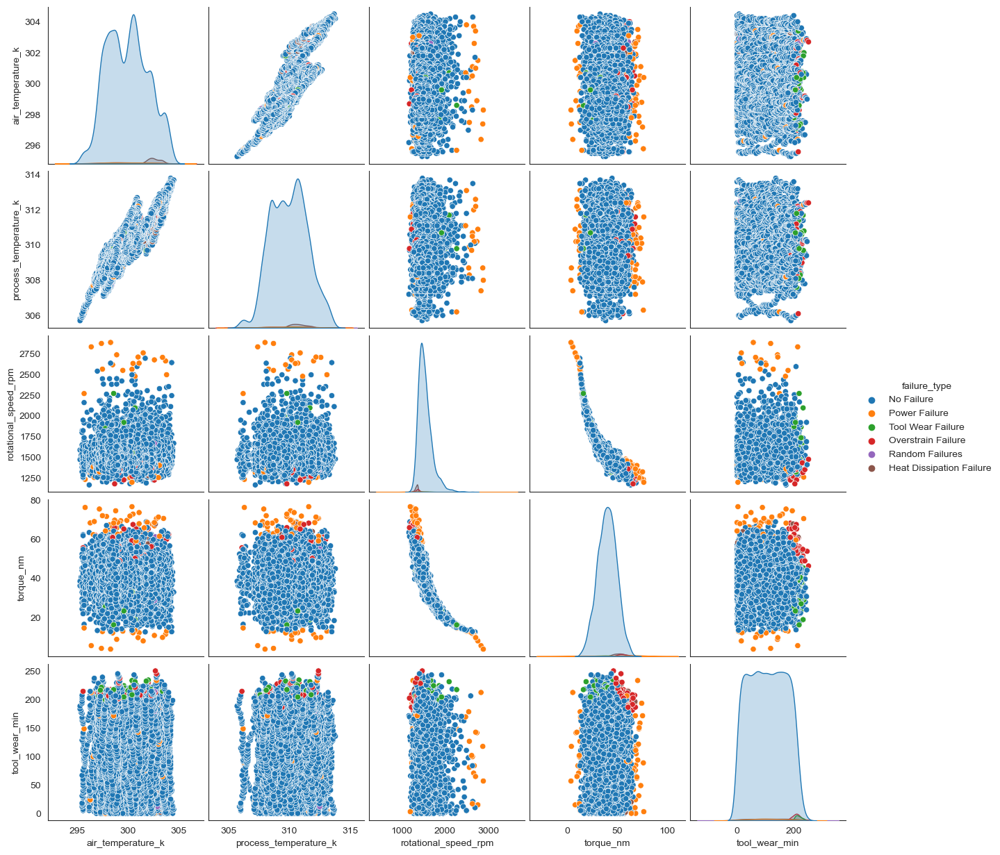

In [8]:
sns.pairplot(df, height=2.5, hue='failure_type')

## Feature Correleation

C:\Users\User\AppData\Local\Temp\ipykernel_19228\2140850633.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<AxesSubplot: >

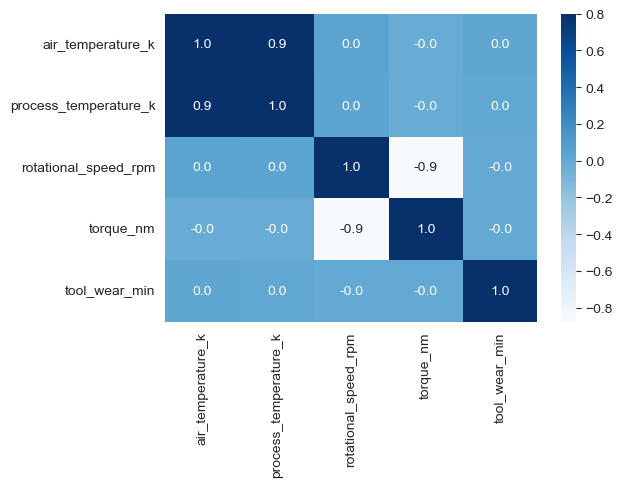

In [9]:
plt.figure(figsize=(6,4))
sns.heatmap(df.corr(), cbar=True, fmt='.1f', vmax=0.8, annot=True, cmap='Blues')

## Feature Boxplots

In [10]:
def create_histogram(column_name):
    plt.figure(figsize=(6,6))
    return px.box(data_frame=df, y=column_name, x='type', color='failure_type', width=800)

In [11]:
create_histogram('air_temperature_k')

<Figure size 600x600 with 0 Axes>

In [12]:
create_histogram('process_temperature_k')

<Figure size 600x600 with 0 Axes>

In [13]:
create_histogram('rotational_speed_rpm')

<Figure size 600x600 with 0 Axes>

In [14]:
create_histogram('torque_nm')

<Figure size 600x600 with 0 Axes>

In [15]:
create_histogram('tool_wear_min')

<Figure size 600x600 with 0 Axes>

In [17]:
fig = px.scatter_3d(df, x='tool_wear_min', y='torque_nm', z='rotational_speed_rpm',
                   color='failure_type')
fig.show()

# Data Preparation

In [18]:
def data_preparation(df, target_name):
    df = df.dropna()
    
    df['target_name_encoded'] = df[target_name].replace({'No Failure': 0, 'Power Failure': 1, 'Tool Wear Failure': 2,
                                                        'Overstrain Failure': 3, 'Random Failures': 4, 'Heat Dissipation Failure': 5})
    df['type'].replace({'L': 0, 'M': 1, 'H': 2}, inplace=True)
    X = df.drop(columns=[target_name, 'target_name_encoded'])
    y = df['target_name_encoded']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=0)
    
    
    
    print('train: ', X_train.shape, y_train.shape)
    print('test: ', X_test.shape, y_test.shape)
    return X, y, X_train, X_test, y_train, y_test

X, y, X_train, X_test, y_train, y_test = data_preparation(df,target_name)

train:  (4666, 6) (4666,)
test:  (2001, 6) (2001,)


In [19]:
y

0       0
1       0
2       0
3       0
4       0
       ..
6662    0
6663    0
6664    0
6665    0
6666    0
Name: target_name_encoded, Length: 6667, dtype: int64

# Model Training

In [20]:
weight_train = compute_sample_weight('balanced', y_train)
weight_test  = compute_sample_weight('balanced', y_test)

xgb_clf = XGBClassifier(booster = 'gbtree', tree_method = 'gpu_hist', sampling_method = 
                        'gradient_based', eval_metric = 'aucpr', objective = 'multi:softmax', 
                       num_class = 6)

xgb_clf.fit(X_train, y_train.ravel(), sample_weight = weight_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='aucpr', feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_class=6,
              num_parallel_tree=None, objective='multi:softmax', ...)

# Model Evaluation

## Model Scoring

In [21]:
score = xgb_clf.score(X_test, y_test.ravel(), sample_weight=weight_test)

In [22]:
y_pred = xgb_clf.predict(X_test)

In [23]:
results_log = classification_report(y_test, y_pred)
print(results_log)

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1933
           1       0.57      0.81      0.67        16
           2       0.17      0.07      0.10        14
           3       0.68      0.87      0.76        15
           4       0.00      0.00      0.00         5
           5       0.64      1.00      0.78        18

    accuracy                           0.97      2001
   macro avg       0.51      0.62      0.55      2001
weighted avg       0.97      0.97      0.97      2001



## Confusion Matrix

<AxesSubplot: xlabel='Predicted', ylabel='Actual'>

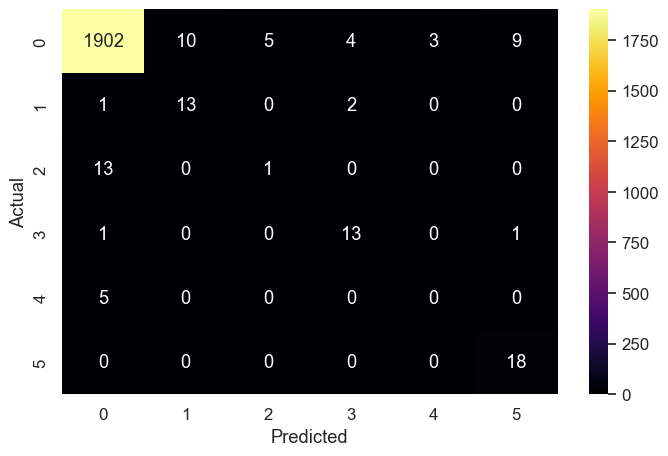

In [24]:
#Para previsões no dataset de teste
y_pred = xgb_clf.predict(X_test)

#Imprimir Matriz de Confusão multi-classe
cnf_matrix = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cnf_matrix, columns=np.unique(y_test), index=np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (8, 5))
sns.set(font_scale=1.1)
sns.heatmap(df_cm, cbar=True, cmap = 'inferno', annot = True, fmt='.0f')

## Cross Validation

In [25]:
scores = cross_validate(xgb_clf, X_train, y_train, cv=7, scoring='f1_weighted', fit_params=
                        {'sample_weight': weight_train})
scores_df = pd.DataFrame(scores)
px.bar(x=scores_df.index, y=scores_df.test_score, width = 800)

# Predicting on New Dataset

In [65]:
df_2 = pd.read_csv('desafio_manutencao_preditiva_teste.csv')

In [66]:
df_2

,udi,product_id,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min
0,446,L47625,L,297.5,308.6,1793,26.7,70
1,7076,L54255,L,300.7,310.5,1536,47.4,192
2,1191,L48370,L,297.2,308.4,1460,42.1,41
3,2618,L49797,L,299.4,309.1,1670,35.9,68
4,5067,L52246,L,304.1,313.1,1550,30.9,9
...,...,...,...,...,...,...,...,...
3328,5554,L52733,L,302.5,311.9,1306,59.7,172
3329,6961,L54140,L,300.7,311.0,1413,52.0,91
3330,6914,L54093,L,300.8,311.2,1481,38.5,181
3331,5510,L52689,L,302.8,312.2,1509,36.5,52


In [67]:
df_2 = df_2.drop(['udi', 'product_id'], axis=1)
df_2['type'].replace({'L': 0, 'M': 1, 'H': 2}, inplace=True)

In [68]:
df_2

,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min
0,0,297.5,308.6,1793,26.7,70
1,0,300.7,310.5,1536,47.4,192
2,0,297.2,308.4,1460,42.1,41
3,0,299.4,309.1,1670,35.9,68
4,0,304.1,313.1,1550,30.9,9
...,...,...,...,...,...,...
3328,0,302.5,311.9,1306,59.7,172
3329,0,300.7,311.0,1413,52.0,91
3330,0,300.8,311.2,1481,38.5,181
3331,0,302.8,312.2,1509,36.5,52


In [69]:
xgb_clf.predict(df_2)

array([0, 0, 0, ..., 0, 0, 0])

In [70]:
df_2['failure_type'] = xgb_clf.predict(df_2)

In [71]:
df_2

,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type
0,0,297.5,308.6,1793,26.7,70,0
1,0,300.7,310.5,1536,47.4,192,0
2,0,297.2,308.4,1460,42.1,41,0
3,0,299.4,309.1,1670,35.9,68,0
4,0,304.1,313.1,1550,30.9,9,0
...,...,...,...,...,...,...,...
3328,0,302.5,311.9,1306,59.7,172,0
3329,0,300.7,311.0,1413,52.0,91,0
3330,0,300.8,311.2,1481,38.5,181,0
3331,0,302.8,312.2,1509,36.5,52,0


In [73]:
df_2.to_csv('predicted.csv')